## Notebook 2: Exploratory Data Analysis

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from scipy import stats
import joblib

In [3]:
#importing the cleaned dataframe dfcodon1 and renaming it to codon

codon = joblib.load('../data/dfcodon1.pkl') 

In [4]:
#peeking at the dataframe
codon.head(5)

,Kingdom,DNAtype,SpeciesID,Ncodons,SpeciesName,UUU,UUC,UUA,UUG,CUU,...,CGG,AGA,AGG,GAU,GAC,GAA,GAG,UAA,UAG,UGA
0,vrl,0,100217,1995,Epizootic haematopoietic necrosis virus,0.01654,0.01203,0.00050,0.00351,0.01203,...,0.00451,0.01303,0.03559,0.01003,0.04612,0.01203,0.04361,0.00251,0.00050,0.00000
1,vrl,0,100220,1474,Bohle iridovirus,0.02714,0.01357,0.00068,0.00678,0.00407,...,0.00136,0.01696,0.03596,0.01221,0.04545,0.01560,0.04410,0.00271,0.00068,0.00000
2,vrl,0,100755,4862,Sweet potato leaf curl virus,0.01974,0.02180,0.01357,0.01543,0.00782,...,0.00596,0.01974,0.02489,0.03126,0.02036,0.02242,0.02468,0.00391,0.00000,0.00144
3,vrl,0,100880,1915,Northern cereal mosaic virus,0.01775,0.02245,0.01619,0.00992,0.01567,...,0.00366,0.01410,0.01671,0.03760,0.01932,0.03029,0.03446,0.00261,0.00157,0.00000
4,vrl,0,100887,22831,Soil-borne cereal mosaic virus,0.02816,0.01371,0.00767,0.03679,0.01380,...,0.00604,0.01494,0.01734,0.04148,0.02483,0.03359,0.03679,0.00000,0.00044,0.00131


---

Plan for EDA:
- Univariate alalysis
- Bivariate analysis
- Check codon distribution for each Kingdom
- Check codon distribution for each DNAtype
- 

### Univariate Analysis

Due to the dataframe containing 69 columns, this will be hard to visualise without breaking up the dataframe into focus points. So, I will isolate the codon columns into a separate dataframe and the rest of the columns into another one, and then do univariate analysis.

- **Separating the codon only columns**

In [5]:
#Getting columns names
codon.columns

Index(['Kingdom', 'DNAtype', 'SpeciesID', 'Ncodons', 'SpeciesName', 'UUU',
       'UUC', 'UUA', 'UUG', 'CUU', 'CUC', 'CUA', 'CUG', 'AUU', 'AUC', 'AUA',
       'AUG', 'GUU', 'GUC', 'GUA', 'GUG', 'GCU', 'GCC', 'GCA', 'GCG', 'CCU',
       'CCC', 'CCA', 'CCG', 'UGG', 'GGU', 'GGC', 'GGA', 'GGG', 'UCU', 'UCC',
       'UCA', 'UCG', 'AGU', 'AGC', 'ACU', 'ACC', 'ACA', 'ACG', 'UAU', 'UAC',
       'CAA', 'CAG', 'AAU', 'AAC', 'UGU', 'UGC', 'CAU', 'CAC', 'AAA', 'AAG',
       'CGU', 'CGC', 'CGA', 'CGG', 'AGA', 'AGG', 'GAU', 'GAC', 'GAA', 'GAG',
       'UAA', 'UAG', 'UGA'],
      dtype='object')

In [6]:
justcodon = codon.drop(columns=['Kingdom', 'DNAtype', 'SpeciesID', 'Ncodons', 'SpeciesName'], axis=1)

In [7]:
justcodon.head(3)

,UUU,UUC,UUA,UUG,CUU,CUC,CUA,CUG,AUU,AUC,...,CGG,AGA,AGG,GAU,GAC,GAA,GAG,UAA,UAG,UGA
0,0.01654,0.01203,0.00050,0.00351,0.01203,0.03208,0.00100,0.04010,0.00551,0.02005,...,0.00451,0.01303,0.03559,0.01003,0.04612,0.01203,0.04361,0.00251,0.00050,0.00000
1,0.02714,0.01357,0.00068,0.00678,0.00407,0.02849,0.00204,0.04410,0.01153,0.02510,...,0.00136,0.01696,0.03596,0.01221,0.04545,0.01560,0.04410,0.00271,0.00068,0.00000
2,0.01974,0.02180,0.01357,0.01543,0.00782,0.01111,0.01028,0.01193,0.02283,0.01604,...,0.00596,0.01974,0.02489,0.03126,0.02036,0.02242,0.02468,0.00391,0.00000,0.00144


- **Separating the non codon into dataframe**

In [8]:
non_codon = codon.drop(columns=['UUU',
       'UUC', 'UUA', 'UUG', 'CUU', 'CUC', 'CUA', 'CUG', 'AUU', 'AUC', 'AUA',
       'AUG', 'GUU', 'GUC', 'GUA', 'GUG', 'GCU', 'GCC', 'GCA', 'GCG', 'CCU',
       'CCC', 'CCA', 'CCG', 'UGG', 'GGU', 'GGC', 'GGA', 'GGG', 'UCU', 'UCC',
       'UCA', 'UCG', 'AGU', 'AGC', 'ACU', 'ACC', 'ACA', 'ACG', 'UAU', 'UAC',
       'CAA', 'CAG', 'AAU', 'AAC', 'UGU', 'UGC', 'CAU', 'CAC', 'AAA', 'AAG',
       'CGU', 'CGC', 'CGA', 'CGG', 'AGA', 'AGG', 'GAU', 'GAC', 'GAA', 'GAG',
       'UAA', 'UAG', 'UGA'], axis=1)

In [9]:
non_codon.head(3)

,Kingdom,DNAtype,SpeciesID,Ncodons,SpeciesName
0,vrl,0,100217,1995,Epizootic haematopoietic necrosis virus
1,vrl,0,100220,1474,Bohle iridovirus
2,vrl,0,100755,4862,Sweet potato leaf curl virus


- **Visualising**

I won't be looking at `SepciesID` or `SpeciesName` as these columns won't have a distribution that offers any noteworthy insights.

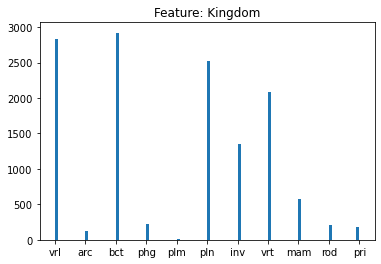

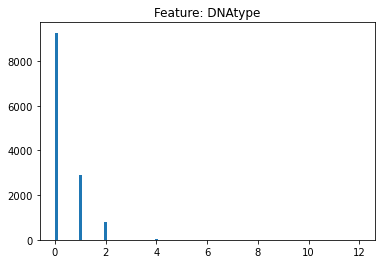

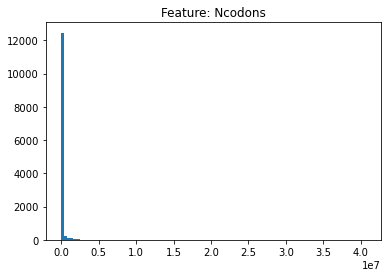

In [10]:
for col in non_codon[['Kingdom', 'DNAtype', 'Ncodons']]:
        plt.figure()
        plt.title(f'Feature: {col}')
        plt.hist(codon[col], bins = 100)
        plt.show()

- `Kingdom` shows the counts of the different kingdom, with bacterial and viral being the ones with the most data points in this dataset.
- `DNAtype` has 12 unique values, however there only seems to show 0, 1, and 2. I will have to apply a log to this graph to see the counts of the other dna types and they could be muted by the high counts from the top three.
- `Ncodons` another distribution that is heavily skewed, I will visualise this one with a log transformation.

<AxesSubplot:>

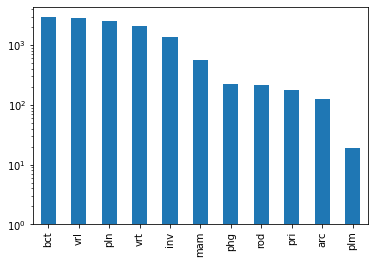

In [11]:
non_codon['Kingdom'].value_counts().plot(kind='bar', log=True)

In [12]:
non_codon['Kingdom'].value_counts(normalize=True)*100

bct    22.413264
vrl    21.737796
pln    19.365981
vrt    15.942585
inv    10.323918
mam     4.390543
phg     1.688671
rod     1.650292
pri     1.381640
arc     0.967148
plm     0.138164
Name: Kingdom, dtype: float64

The dataset does contain rows for kingdoms beside the top three, however there is a high imbalance here. with some of the classes having less than 5%. This will need some feature engineering before modelling as this column is one of the targets I will be looking at classifying.

<AxesSubplot:>

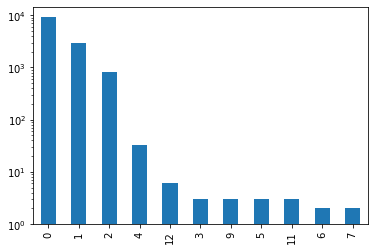

In [13]:
non_codon['DNAtype'].value_counts().plot(kind='bar', log=True)

In [ ]:
non_codon['DNAtype'].value_counts(normalize=True)*100

0     71.131409
1     22.252072
2      6.263433
4      0.237949
12     0.038379
3      0.015352
9      0.015352
5      0.015352
11     0.015352
6      0.007676
7      0.007676
Name: DNAtype, dtype: float64

<AxesSubplot:ylabel='Frequency'>

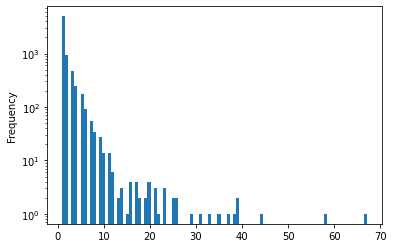

In [ ]:
non_codon['Ncodons'].value_counts().plot(kind='hist', bins=100, log=True)

---

In [ ]:
#UAA UAG UGA ##distribution of stop codons

px.histogram(
    data_frame=dfcodon1,
    x='UAA',
    nbins=12,
    title='',
    labels={
        'petal_width': 'Petal width (cm)'
    },
    log_y=True,
    height=500,
    width=800)


In [ ]:
px.histogram(
    data_frame=dfcodon1,
    x='UAG',
    nbins=12,
    title='Petal width distribution',
    labels={
        'petal_width': 'Petal width (cm)'
    },
    log_y= True, 
    height=500,
    width=800)


In [ ]:
px.histogram(
    data_frame=dfcodon1,
    x='UGA',
    nbins=12,
    title='Petal width distribution',
    labels={
        'petal_width': 'Petal width (cm)'
    },
    log_y= True,
    height=500,
    width=800)

In [ ]:
dfcodon1.head(1)

,Kingdom,DNAtype,SpeciesID,Ncodons,SpeciesName,UUU,UUC,UUA,UUG,CUU,...,CGG,AGA,AGG,GAU,GAC,GAA,GAG,UAA,UAG,UGA
0,vrl,0,100217,1995,Epizootic haematopoietic necrosis virus,0.01654,0.01203,0.0005,0.00351,0.01203,...,0.00451,0.01303,0.03559,0.01003,0.04612,0.01203,0.04361,0.00251,0.0005,0.0


ValueError: shape mismatch: objects cannot be broadcast to a single shape.  Mismatch is between arg 0 with shape (30,) and arg 1 with shape (13028,).

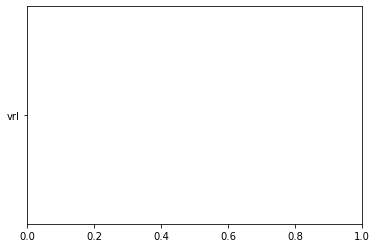

In [ ]:
uaa = dfcodon1.groupby(['DNAtype', 'Kingdom'])['UAA'].sum()

###############################
### why isn't this working? ###
###############################
plt.figure()
plt.bar(uaa, dfcodon1['Kingdom'])

In [ ]:

px.histogram(
    data_frame=dfcodon1,
    x='UAA',
    y='Kingdom',
    nbins=12,
    title='',
    labels={
        'Stop Codon UAA distribution by Kingdom'
    },
    height=500,
    width=800)

In [ ]:
# plt.figure(figsize=(50,50))
# sns.heatmap(dfcodon1.corr(), annot=True, cmap='PuOr')
# plt.show()

In [ ]:
dfjustcodon2 = dfcodon1.drop(columns=['Kingdom', 'SpeciesID', 'DNAtype', 'Ncodons', 'SpeciesName'])
# codonlist = list(dfjustcodon2)
# kngdm = dfcodon1.groupby('Kingdom')[codonlist]

fig = px.imshow(dfjustcodon2, color_continuous_scale='Cividis', origin='lower')  #or RdBu_r

fig.show()

In [ ]:
dfcodon1['Kingdom'].unique()

array(['vrl', 'arc', 'bct', 'phg', 'plm', 'pln', 'inv', 'vrt', 'mam',
       'rod', 'pri'], dtype=object)